# Projet StatApp

## Analyse des données 

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt 
from tqdm import tqdm

!pip install pandas_profiling 
!pip install ipywidgets
from pandas_profiling import ProfileReport

In [2]:
df_A=pd.read_csv('/Users/Corentin/Desktop/statapp/transactions_A.csv')
df_B=pd.read_csv('/Users/Corentin/Desktop/statapp/transactions_B.csv')
df_A

,tx_id,sender_account_id,receiver_account_id,tx_amount,timestamp,tx_type,sender_bank_id,sender_first_name,sender_last_name,sender_country_code,sender_birth_date,sender_zip_code,receiver_bank_id,receiver_first_name,receiver_last_name,receiver_country_code,receiver_birth_date,receiver_zip_code,is_alert_solo,is_alert_pooled
0,3109,6822.0,NaN,229.97,2018-03-03,WIRE,A,Marie,Lee,FR,1937-08-23,27800,C,Maritn,Alvarez,FR,1930-08-29,89160,False,False
1,1829,NaN,9011.0,117.83,2018-03-03,WIRE,B,Kurt,Brignac,FR,1962-09-07,35660,A,Joseph,Gable,FR,1933-12-23,62116,False,False
2,1830,NaN,7140.0,117.83,2018-03-03,WIRE,B,Kurt,Brignac,FR,1962-09-07,35660,A,Shelley,Spencer,FR,1944-12-23,34360,False,False
3,1831,NaN,1822.0,526.02,2018-03-03,WIRE,C,Shelly,Jethva,CN,1961-06-29,65230,A,Ambrose,Cole,FR,1958-04-07,3800,False,False
4,1832,5390.0,NaN,35.79,2018-03-03,WIRE,A,Judy,James,FR,1942-04-08,42140,C,Jose,Fiume,FR,1981-08-28,66820,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
837976,1320127,4521.0,8882.0,462.04,2021-12-25,WIRE,A,James,Laday,FR,1936-08-22,53240,A,Richard,Linkous,FR,1965-10-13,10150,False,False
837977,1317252,5083.0,NaN,11.68,2021-12-25,WIRE,A,Johnny,Miller,FR,1969-03-23,27230,B,Ruth,Cuadras,FR,1937-05-23,50470,False,False
837978,1322052,9771.0,NaN,189.02,2021-12-25,CHECK,A,Alan,Mccormick,FR,1918-11-02,6340,C,Van,Johnson,FR,1954-12-26,69630,False,False
837979,1317047,NaN,9832.0,11.96,2021-12-25,WIRE,C,Sally,Simmon,FR,1979-07-22,80290,A,Richard,Wynne,FR,1944-02-19,76570,False,False


In [3]:
len(df_A.columns)

20

In [4]:
df_B.head(5)

,tx_id,sender_account_id,receiver_account_id,tx_amount,timestamp,tx_type,sender_bank_id,sender_first_name,sender_last_name,sender_country_code,sender_birth_date,sender_zip_code,receiver_bank_id,receiver_first_name,receiver_last_name,receiver_country_code,receiver_birth_date,receiver_zip_code,is_alert_solo,is_alert_pooled
0,1364,NaN,595.0,129.41,2018-03-03,WIRE,C,Jonathan,Smith,FR,1944-08-29,13300,B,Shannon,Bailey,FR,1973-06-02,54210,False,False
1,4318,785.0,8854.0,129.66,2018-03-03,WIRE,B,Harry,Alfano,FR,1939-02-03,25250,B,John,Adkins,FR,1958-11-07,20171,False,False
2,4319,785.0,NaN,129.66,2018-03-03,WIRE,B,Harry,Alfano,FR,1939-02-03,25250,A,Jason,Arsenault,FR,1935-03-03,51240,False,False
3,2549,7795.0,NaN,189.25,2018-03-03,WIRE,B,Mark,Sauders,FR,1920-12-31,91640,C,Nicholas,Omersa,FR,1921-06-29,36290,False,False
4,4320,785.0,NaN,129.66,2018-03-03,WIRE,B,Harry,Alfano,FR,1939-02-03,25250,A,Wilhelmina,Eberhardt,FR,1941-04-25,77440,False,False


In [5]:
df_B

,tx_id,sender_account_id,receiver_account_id,tx_amount,timestamp,tx_type,sender_bank_id,sender_first_name,sender_last_name,sender_country_code,sender_birth_date,sender_zip_code,receiver_bank_id,receiver_first_name,receiver_last_name,receiver_country_code,receiver_birth_date,receiver_zip_code,is_alert_solo,is_alert_pooled
0,1364,NaN,595.0,129.41,2018-03-03,WIRE,C,Jonathan,Smith,FR,1944-08-29,13300,B,Shannon,Bailey,FR,1973-06-02,54210,False,False
1,4318,785.0,8854.0,129.66,2018-03-03,WIRE,B,Harry,Alfano,FR,1939-02-03,25250,B,John,Adkins,FR,1958-11-07,20171,False,False
2,4319,785.0,NaN,129.66,2018-03-03,WIRE,B,Harry,Alfano,FR,1939-02-03,25250,A,Jason,Arsenault,FR,1935-03-03,51240,False,False
3,2549,7795.0,NaN,189.25,2018-03-03,WIRE,B,Mark,Sauders,FR,1920-12-31,91640,C,Nicholas,Omersa,FR,1921-06-29,36290,False,False
4,4320,785.0,NaN,129.66,2018-03-03,WIRE,B,Harry,Alfano,FR,1939-02-03,25250,A,Wilhelmina,Eberhardt,FR,1941-04-25,77440,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
458061,1317989,2784.0,1624.0,163.36,2021-12-25,WIRE,B,Jason,Scarlato,FR,1929-11-15,31450,B,Tracey,Williams,FR,1964-06-16,82340,False,False
458062,1322199,NaN,1834.0,10.45,2021-12-25,CHECK,C,Walter,Gabriel,HU,1923-07-30,43260,B,Joseph,Hardee,FR,1925-05-02,77133,False,False
458063,1322359,NaN,9145.0,513.78,2021-12-25,WIRE,A,Sean,Dunn,FR,1959-06-16,89160,B,Morgan,Lakey,FR,1956-04-07,7000,False,False
458064,1317568,5624.0,4994.0,109.41,2021-12-25,WIRE,B,Molly,Rady,FR,1938-09-21,9140,B,Andrew,Willis,FR,1928-03-01,10140,False,False


In [6]:
ProfileReport(df_A)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
ProfileReport(df_B)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df_A.describe()

,tx_id,sender_account_id,receiver_account_id,tx_amount,sender_zip_code,receiver_zip_code
count,8.379810e+05,507545.000000,544337.000000,8.379810e+05,837981.000000,837981.000000
mean,6.617668e+05,6027.147731,6922.858446,1.124119e+05,46639.543350,46481.647856
std,3.816868e+05,2917.675278,2786.177498,1.300614e+06,26097.852992,25602.138146
min,2.000000e+00,1.000000,3.000000,0.000000e+00,1000.000000,1000.000000
25%,3.314150e+05,3610.000000,4962.000000,2.565000e+01,24480.000000,24600.000000
50%,6.621700e+05,6540.000000,7671.000000,1.605200e+02,49360.000000,48210.000000
75%,9.918210e+05,8691.000000,9421.000000,4.500000e+02,67280.000000,66130.000000
max,1.323233e+06,9993.000000,9993.000000,2.147484e+07,98881.000000,98878.000000


In [9]:
df_B.describe()

,tx_id,sender_account_id,receiver_account_id,tx_amount,sender_zip_code,receiver_zip_code
count,4.580660e+05,254590.000000,258056.000000,4.580660e+05,458066.000000,458066.000000
mean,6.616385e+05,6017.893008,6789.091321,1.167315e+05,46688.060917,46411.434966
std,3.821701e+05,2919.470370,2856.340195,1.326649e+06,26004.279511,25557.783544
min,3.000000e+00,4.000000,5.000000,0.000000e+00,1000.000000,1000.000000
25%,3.308372e+05,3605.000000,4595.000000,2.381000e+01,24560.000000,25160.000000
50%,6.611210e+05,6525.000000,7595.000000,1.556900e+02,49230.000000,48100.000000
75%,9.933035e+05,8685.000000,9344.000000,4.383200e+02,67250.000000,65380.000000
max,1.323234e+06,9995.000000,9995.000000,2.147484e+07,98878.000000,98881.000000


In [10]:
df_A.columns

Index(['tx_id', 'sender_account_id', 'receiver_account_id', 'tx_amount',
       'timestamp', 'tx_type', 'sender_bank_id', 'sender_first_name',
       'sender_last_name', 'sender_country_code', 'sender_birth_date',
       'sender_zip_code', 'receiver_bank_id', 'receiver_first_name',
       'receiver_last_name', 'receiver_country_code', 'receiver_birth_date',
       'receiver_zip_code', 'is_alert_solo', 'is_alert_pooled'],
      dtype='object')

In [11]:
df_B.columns 

Index(['tx_id', 'sender_account_id', 'receiver_account_id', 'tx_amount',
       'timestamp', 'tx_type', 'sender_bank_id', 'sender_first_name',
       'sender_last_name', 'sender_country_code', 'sender_birth_date',
       'sender_zip_code', 'receiver_bank_id', 'receiver_first_name',
       'receiver_last_name', 'receiver_country_code', 'receiver_birth_date',
       'receiver_zip_code', 'is_alert_solo', 'is_alert_pooled'],
      dtype='object')

### On va regarder les target pour les solo et les pooled 
#### Transactions A

In [12]:
# les différentes alert 
print('Le nombre de alert solo est de '+ str( len(df_A[df_A['is_alert_solo']==True])) + ' ce qui correspond à ' + str( len(df_A[df_A['is_alert_solo']==True])/len(df_A)*100) + ' %')
print('Le nombre de alert pooled est de '+ str( len(df_A[df_A['is_alert_pooled']==True])) + ' ce qui correspond à ' + str( len(df_A[df_A['is_alert_pooled']==True])/len(df_A)*100) + ' %') 
print('Le nombre de alert pooled et solo est de ' + str( len(df_A[(df_A['is_alert_solo']==True) &(df_A['is_alert_pooled']==True)])) + ' ce qui correspond à ' + str( len(df_A[(df_A['is_alert_solo']==True) &(df_A['is_alert_pooled']==True)])/len(df_A)*100) + ' %')
print('Le nombre de alert pooled et NON alert solo est de ' + str( len(df_A[(df_A['is_alert_solo']!=True) &(df_A['is_alert_pooled']==True)])) + ' ce qui correspond à ' + str( len(df_A[(df_A['is_alert_solo']!=True) &(df_A['is_alert_pooled']==True)])/len(df_A)*100) + ' %')
print('Le nombre de NON alert pooled et alert solo est de ' + str( len(df_A[(df_A['is_alert_solo']==True) &(df_A['is_alert_pooled']!=True)])) + ' ce qui correspond à ' + str( len(df_A[(df_A['is_alert_solo']==True) &(df_A['is_alert_pooled']!=True)])/len(df_A)*100) + ' %')

Le nombre de alert solo est de 5574 ce qui correspond à 0.6651702126897865 %
Le nombre de alert pooled est de 1040 ce qui correspond à 0.12410782583375997 %
Le nombre de alert pooled et solo est de 537 ce qui correspond à 0.06408259853147028 %
Le nombre de alert pooled et NON alert solo est de 503 ce qui correspond à 0.06002522730228967 %
Le nombre de NON alert pooled et alert solo est de 5037 ce qui correspond à 0.6010876141583162 %


#### Transactions B

In [13]:
print('Le nombre de alert solo est de '+ str( len(df_B[df_B['is_alert_solo']==True])) + ' ce qui correspond à ' + str( len(df_B[df_B['is_alert_solo']==True])/len(df_B)*100) + ' %')
print('Le nombre de alert pooled est de '+ str( len(df_B[df_B['is_alert_pooled']==True])) + ' ce qui correspond à ' + str( len(df_B[df_B['is_alert_pooled']==True])/len(df_B)*100) + ' %') 
print('Le nombre de alert pooled et solo est de ' + str( len(df_B[(df_B['is_alert_solo']==True) &(df_B['is_alert_pooled']==True)])) + ' ce qui correspond à ' + str( len(df_B[(df_B['is_alert_solo']==True) &(df_B['is_alert_pooled']==True)])/len(df_B)*100) + ' %')
print('Le nombre de alert pooled et NON alert solo est de ' + str( len(df_B[(df_B['is_alert_solo']!=True) &(df_B['is_alert_pooled']==True)])) + ' ce qui correspond à ' + str( len(df_B[(df_B['is_alert_solo']!=True) &(df_B['is_alert_pooled']==True)])/len(df_B)*100) + ' %')
print('Le nombre de NON alert pooled et alert solo est de ' + str( len(df_B[(df_B['is_alert_solo']==True) &(df_B['is_alert_pooled']!=True)])) + ' ce qui correspond à ' + str( len(df_B[(df_B['is_alert_solo']==True) &(df_B['is_alert_pooled']!=True)])/len(df_B)*100) + ' %')

Le nombre de alert solo est de 2746 ce qui correspond à 0.5994769312719128 %
Le nombre de alert pooled est de 587 ce qui correspond à 0.1281474721983295 %
Le nombre de alert pooled et solo est de 284 ce qui correspond à 0.0619997991555802 %
Le nombre de alert pooled et NON alert solo est de 303 ce qui correspond à 0.0661476730427493 %
Le nombre de NON alert pooled et alert solo est de 2462 ce qui correspond à 0.5374771321163325 %


# Premières analyses

- Les alert solo sont 5 fois plus fréquentes que les alert pooled.
- Lorsque une transaction est alertée "en pooled" alors elle est alertée en solo dans 50% des cas. 
- En revanche lorsqu'une transaction est alertée en solo elle l'est également "en pooled" dans 10% des cas. 

#### Montant moyen d'une transaction en fonction de son label d'alerte 

In [14]:
print(' Le montant médian des transactions pour les alert solos est de ' + str(round(df_A[df_A['is_alert_solo']==True].tx_amount.median(),2)) + ' €')
print(' Le montant médian des transactions pour les alert pooled est de ' + str(round(df_A[df_A['is_alert_pooled']==True].tx_amount.median(),2)) + ' €')
print(' Le montant médian des transactions est de ' + str(round(df_A.tx_amount.median(),2)) + ' €')

 Le montant médian des transactions pour les alert solos est de 143.66 €
 Le montant médian des transactions pour les alert pooled est de 10.64 €
 Le montant médian des transactions est de 160.52 €


In [15]:
print(' Le montant moyen des transactions pour les alert solos est de ' + str(round(df_A[df_A['is_alert_solo']==True].tx_amount.mean(),2)) + ' €')
print(' Le montant moyen des transactions pour les alert pooled est de ' + str(round(df_A[df_A['is_alert_pooled']==True].tx_amount.mean(),2)) + ' €')
print(' Le montant moyen des transactions est de ' + str(round(df_A.tx_amount.mean(),2)) + ' €')

 Le montant moyen des transactions pour les alert solos est de 74369.95 €
 Le montant moyen des transactions pour les alert pooled est de 9.82 €
 Le montant moyen des transactions est de 112411.92 €


## ==> Il y a des valeurs extrêmales avec des montants très importants ! 

In [16]:
L=df_A[(df_A['is_alert_solo']==True) &(df_A['is_alert_pooled']==True)].index
df_A['is_both_alert']=pd.DataFrame(df_A.index).apply(lambda x : x.isin(L))
df_A

,tx_id,sender_account_id,receiver_account_id,tx_amount,timestamp,tx_type,sender_bank_id,sender_first_name,sender_last_name,sender_country_code,...,sender_zip_code,receiver_bank_id,receiver_first_name,receiver_last_name,receiver_country_code,receiver_birth_date,receiver_zip_code,is_alert_solo,is_alert_pooled,is_both_alert
0,3109,6822.0,NaN,229.97,2018-03-03,WIRE,A,Marie,Lee,FR,...,27800,C,Maritn,Alvarez,FR,1930-08-29,89160,False,False,False
1,1829,NaN,9011.0,117.83,2018-03-03,WIRE,B,Kurt,Brignac,FR,...,35660,A,Joseph,Gable,FR,1933-12-23,62116,False,False,False
2,1830,NaN,7140.0,117.83,2018-03-03,WIRE,B,Kurt,Brignac,FR,...,35660,A,Shelley,Spencer,FR,1944-12-23,34360,False,False,False
3,1831,NaN,1822.0,526.02,2018-03-03,WIRE,C,Shelly,Jethva,CN,...,65230,A,Ambrose,Cole,FR,1958-04-07,3800,False,False,False
4,1832,5390.0,NaN,35.79,2018-03-03,WIRE,A,Judy,James,FR,...,42140,C,Jose,Fiume,FR,1981-08-28,66820,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
837976,1320127,4521.0,8882.0,462.04,2021-12-25,WIRE,A,James,Laday,FR,...,53240,A,Richard,Linkous,FR,1965-10-13,10150,False,False,False
837977,1317252,5083.0,NaN,11.68,2021-12-25,WIRE,A,Johnny,Miller,FR,...,27230,B,Ruth,Cuadras,FR,1937-05-23,50470,False,False,False
837978,1322052,9771.0,NaN,189.02,2021-12-25,CHECK,A,Alan,Mccormick,FR,...,6340,C,Van,Johnson,FR,1954-12-26,69630,False,False,False
837979,1317047,NaN,9832.0,11.96,2021-12-25,WIRE,C,Sally,Simmon,FR,...,80290,A,Richard,Wynne,FR,1944-02-19,76570,False,False,False


# On va faire un focus sur les transactions de montants plus faibles (la grande majorité des transactions)

In [17]:
montant=800
print( str(round(len(df_A[df_A['tx_amount']<montant])/len(df_A)*100,2))+ f" % des transactions ont un montant inférieur à {montant} €")
print( str(round(len(df_B[df_B['tx_amount']<montant])/len(df_B)*100,2))+ f" % des transactions ont un montant inférieur à {montant} €")

97.14 % des transactions ont un montant inférieur à 800 €
97.05 % des transactions ont un montant inférieur à 800 €


Text(-21.180555555555557, 0.5, 'Count')

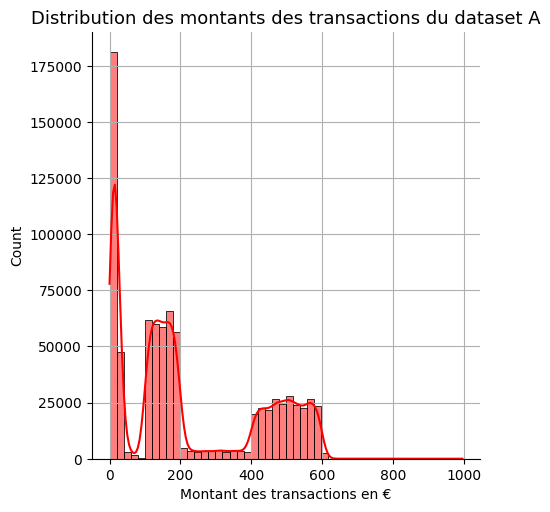

In [18]:
sns.displot(df_A[df_A['tx_amount']<1000]['tx_amount'], kde= True, color='red', bins=50)
plt.grid()
plt.title('Distribution des montants des transactions du dataset A', size= 13)
plt.xlabel('Montant des transactions en €')
plt.ylabel('Count')

Text(-21.180555555555557, 0.5, 'Count')

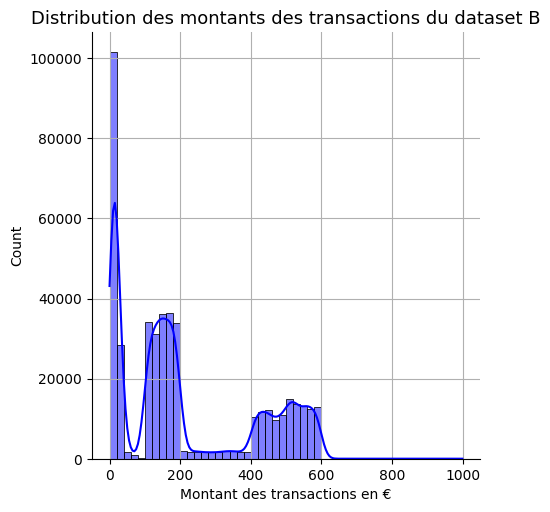

In [19]:
sns.displot(df_B[df_B['tx_amount']<1000]['tx_amount'], kde= True, color='blue', bins=50)
plt.grid()
plt.title('Distribution des montants des transactions du dataset B', size= 13)
plt.xlabel('Montant des transactions en €')
plt.ylabel('Count')

Text(-3.8055555555555554, 0.5, 'Count')

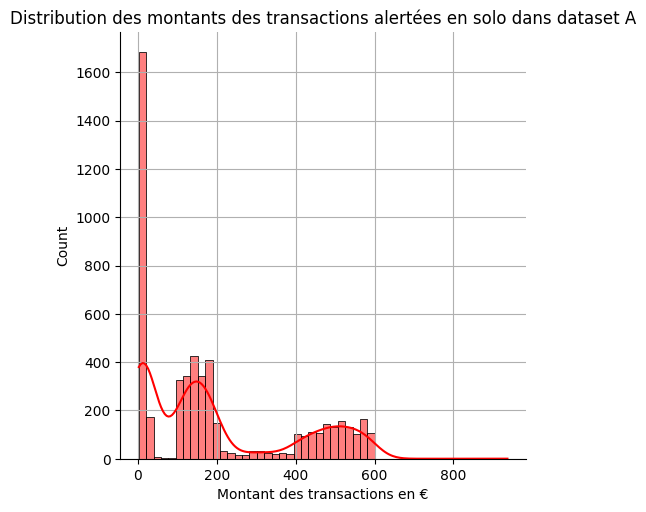

In [20]:
sns.displot(df_A[(df_A['is_alert_solo']==True)&(df_A['tx_amount']<1000)]['tx_amount'], kde=True, color='red', bins=50) 
plt.grid()
plt.title('Distribution des montants des transactions alertées en solo dans dataset A')
plt.xlabel('Montant des transactions en €')
plt.ylabel('Count')

Text(5.069444444444445, 0.5, 'Count')

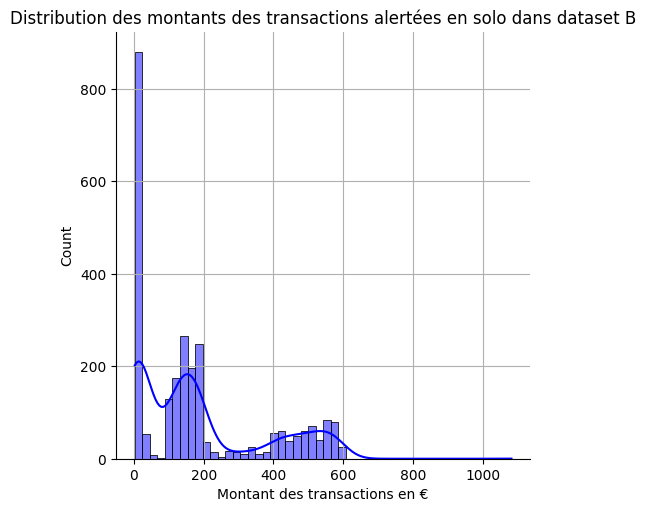

In [21]:
sns.displot(df_B[(df_B['is_alert_solo']==True)&(df_B['tx_amount']<1100)]['tx_amount'], kde=True, color='blue', bins=50) 
plt.grid()
plt.title('Distribution des montants des transactions alertées en solo dans dataset B')
plt.xlabel('Montant des transactions en €')
plt.ylabel('Count')

In [22]:
df_A[(df_A['is_alert_pooled']==True)].describe()

,tx_id,sender_account_id,receiver_account_id,tx_amount,sender_zip_code,receiver_zip_code
count,1.040000e+03,650.000000,652.000000,1040.000000,1040.000000,1040.000000
mean,6.558515e+05,6608.726154,6407.785276,9.820125,45548.664423,45530.421154
std,3.851268e+05,2937.867002,2998.098573,5.829639,25981.916791,26395.231674
min,9.490000e+02,153.000000,91.000000,2.540000,1090.000000,1120.000000
25%,3.109048e+05,4272.750000,3727.500000,3.805000,23517.500000,24220.000000
50%,6.038490e+05,7357.500000,7202.000000,10.640000,45630.000000,43230.000000
75%,1.014375e+06,9342.500000,9345.000000,15.270000,65700.000000,67315.000000
max,1.317852e+06,9993.000000,9993.000000,19.920000,98828.000000,98828.000000


Text(4.944444444444445, 0.5, 'Count')

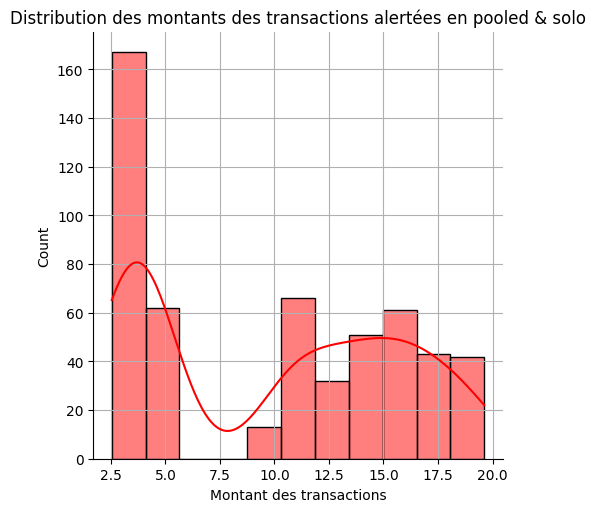

In [23]:
sns.displot(df_A[(df_A['is_alert_solo']==True)&(df_A['is_alert_pooled']==True)]['tx_amount'], kde=True, color='red') 
plt.grid()
plt.title('Distribution des montants des transactions alertées en pooled & solo')
plt.xlabel('Montant des transactions')
plt.ylabel('Count')

### Banques dans les transactions 

In [24]:
df_A["Banques_en_jeu"]= df_A["sender_bank_id"]+" - " + df_A["receiver_bank_id"]
df= df_A.groupby(by=["Banques_en_jeu"])["Banques_en_jeu"].agg(['count'])
df.sort_values('count', ascending= False, inplace=True)
df.reset_index(inplace=True)

df_B["Banques_en_jeu"]= df_B["sender_bank_id"]+" - " + df_B["receiver_bank_id"]
df2= df_B.groupby(by=["Banques_en_jeu"])["Banques_en_jeu"].agg(['count'])
df2.sort_values('count', ascending= False, inplace=True)
df2.reset_index(inplace=True)

In [25]:
display(df)
df2

,Banques_en_jeu,count
0,C - A,221011
1,A - A,213901
2,A - C,190420
3,B - A,109425
4,A - B,103224


,Banques_en_jeu,count
0,B - A,109425
1,A - B,103224
2,C - B,100252
3,B - C,90585
4,B - B,54580


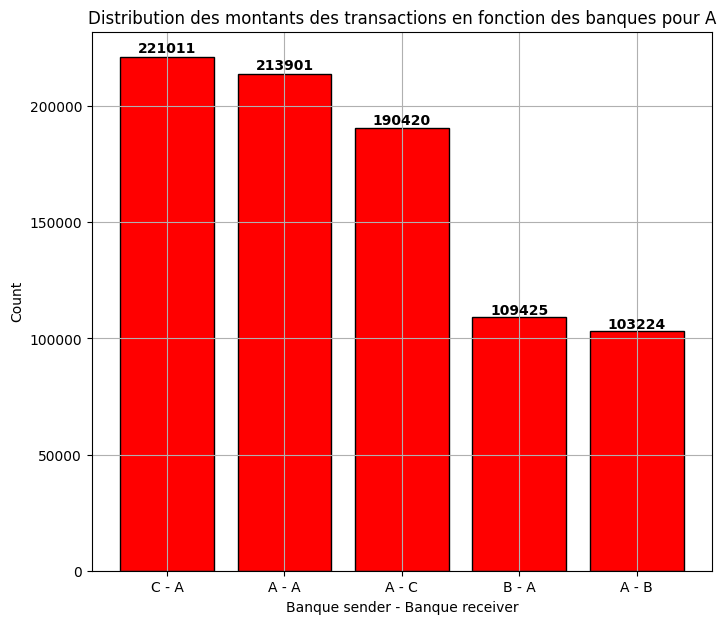

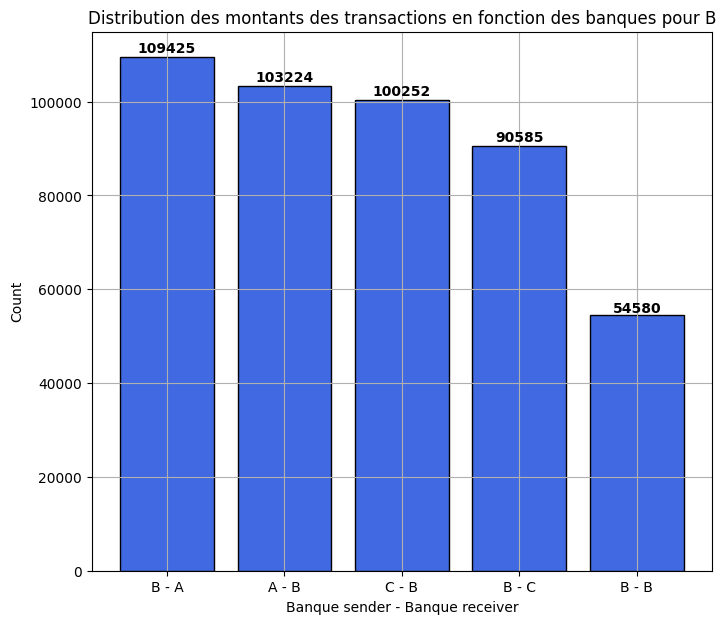

In [26]:
fig, ax = plt.subplots(figsize=(8,7))
rects1= ax.bar(df["Banques_en_jeu"], df["count"], label='Banques dans les transactions',
                color='red', edgecolor = "black")
#ax.set_ylabel("Revenu moyen des films", labelpad=5, fontsize=12)
plt.grid()
plt.title('Distribution des montants des transactions en fonction des banques pour A')
plt.xlabel('Banque sender - Banque receiver')
plt.ylabel('Count')

i=0
for p in rects1:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.01,
             str(df['count'][i]),
             ha='center',
             weight='bold')
    i+=1

fig, ax = plt.subplots(figsize=(8,7))
rects2= ax.bar(df2["Banques_en_jeu"], df2["count"], label='Banques dans les transactions',
                color='royalblue', edgecolor = "black")
#ax.set_ylabel("Revenu moyen des films", labelpad=5, fontsize=12)
plt.grid()
plt.title('Distribution des montants des transactions en fonction des banques pour B')
plt.xlabel('Banque sender - Banque receiver')
plt.ylabel('Count')

i=0
for p in rects2:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()
    plt.text(x+width/2,
             y+height*1.01,
             str(df2['count'][i]),
             ha='center',
             weight='bold')
    i+=1

Toutes les transactions qui sont labellisées ALERT en pooled sont des transactions dont le montant est inférieur à 20 €. 
Ainsi les transactions qui sont labellisées ALERT en pooled et en solo sont des transactions également inférieure à ce montant. 

In [27]:
df_A.dtypes

tx_id                      int64
sender_account_id        float64
receiver_account_id      float64
tx_amount                float64
timestamp                 object
tx_type                   object
sender_bank_id            object
sender_first_name         object
sender_last_name          object
sender_country_code       object
sender_birth_date         object
sender_zip_code            int64
receiver_bank_id          object
receiver_first_name       object
receiver_last_name        object
receiver_country_code     object
receiver_birth_date       object
receiver_zip_code          int64
is_alert_solo               bool
is_alert_pooled             bool
is_both_alert               bool
Banques_en_jeu            object
dtype: object

In [28]:
df_A['timestamp2'] = pd.to_datetime(df_A.timestamp, format='%Y-%m-%d', errors = 'ignore')
df_A['sender_birth_date'] = pd.to_datetime(df_A.sender_birth_date, format='%Y-%m-%d', errors = 'ignore')
df_A['receiver_birth_date'] = pd.to_datetime(df_A.receiver_birth_date, format='%Y-%m-%d', errors = 'ignore')

df_B['timestamp2'] = pd.to_datetime(df_B.timestamp, format='%Y-%m-%d', errors = 'ignore')
df_B['sender_birth_date'] = pd.to_datetime(df_B.sender_birth_date, format='%Y-%m-%d', errors = 'ignore')
df_B['receiver_birth_date'] = pd.to_datetime(df_B.receiver_birth_date, format='%Y-%m-%d', errors = 'ignore')

In [29]:
df_A

,tx_id,sender_account_id,receiver_account_id,tx_amount,timestamp,tx_type,sender_bank_id,sender_first_name,sender_last_name,sender_country_code,...,receiver_first_name,receiver_last_name,receiver_country_code,receiver_birth_date,receiver_zip_code,is_alert_solo,is_alert_pooled,is_both_alert,Banques_en_jeu,timestamp2
0,3109,6822.0,NaN,229.97,2018-03-03,WIRE,A,Marie,Lee,FR,...,Maritn,Alvarez,FR,1930-08-29,89160,False,False,False,A - C,2018-03-03
1,1829,NaN,9011.0,117.83,2018-03-03,WIRE,B,Kurt,Brignac,FR,...,Joseph,Gable,FR,1933-12-23,62116,False,False,False,B - A,2018-03-03
2,1830,NaN,7140.0,117.83,2018-03-03,WIRE,B,Kurt,Brignac,FR,...,Shelley,Spencer,FR,1944-12-23,34360,False,False,False,B - A,2018-03-03
3,1831,NaN,1822.0,526.02,2018-03-03,WIRE,C,Shelly,Jethva,CN,...,Ambrose,Cole,FR,1958-04-07,3800,False,False,False,C - A,2018-03-03
4,1832,5390.0,NaN,35.79,2018-03-03,WIRE,A,Judy,James,FR,...,Jose,Fiume,FR,1981-08-28,66820,False,False,False,A - C,2018-03-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
837976,1320127,4521.0,8882.0,462.04,2021-12-25,WIRE,A,James,Laday,FR,...,Richard,Linkous,FR,1965-10-13,10150,False,False,False,A - A,2021-12-25
837977,1317252,5083.0,NaN,11.68,2021-12-25,WIRE,A,Johnny,Miller,FR,...,Ruth,Cuadras,FR,1937-05-23,50470,False,False,False,A - B,2021-12-25
837978,1322052,9771.0,NaN,189.02,2021-12-25,CHECK,A,Alan,Mccormick,FR,...,Van,Johnson,FR,1954-12-26,69630,False,False,False,A - C,2021-12-25
837979,1317047,NaN,9832.0,11.96,2021-12-25,WIRE,C,Sally,Simmon,FR,...,Richard,Wynne,FR,1944-02-19,76570,False,False,False,C - A,2021-12-25


In [30]:
len(df_A["timestamp"].drop_duplicates())

200

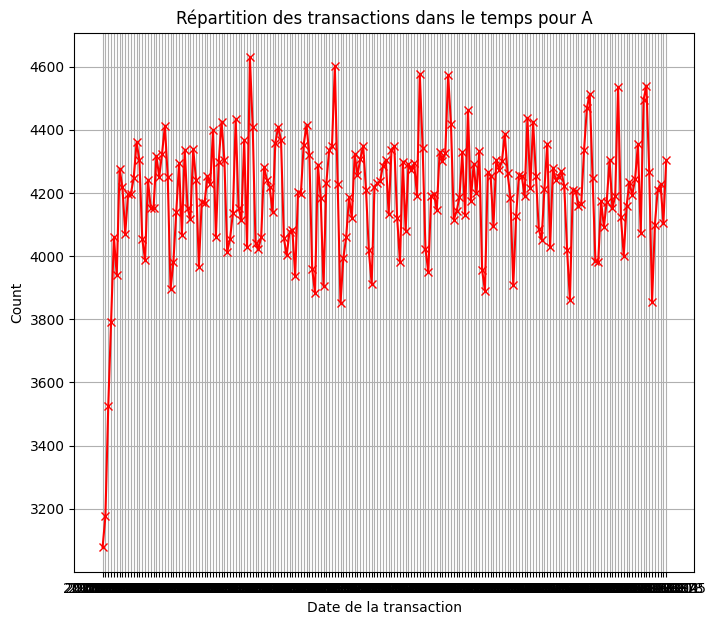

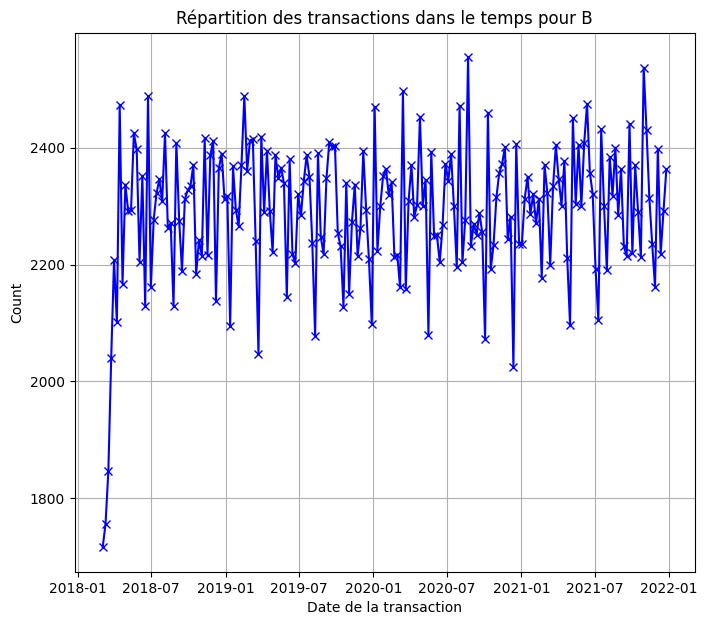

In [31]:
fig, ax = plt.subplots(figsize=(8,7))
rects1= ax.plot(df_A["timestamp"].drop_duplicates(), df_A.groupby(['timestamp'])['timestamp'].agg('count'), 'rx-' )
#ax.set_ylabel("Revenu moyen des films", labelpad=5, fontsize=12)
#plt.grid()
plt.title('Répartition des transactions dans le temps pour A')
plt.xlabel('Date de la transaction')
plt.ylabel('Count')
plt.grid()

fig, ax = plt.subplots(figsize=(8,7))
rects1= ax.plot(df_B["timestamp2"].drop_duplicates(), df_B.groupby(['timestamp2'])['timestamp2'].agg('count'), 'bx-' )
#ax.set_ylabel("Revenu moyen des films", labelpad=5, fontsize=12)
#plt.grid()
plt.title('Répartition des transactions dans le temps pour B')
plt.xlabel('Date de la transaction')
plt.ylabel('Count')
plt.grid()

In [32]:
df_A['year']=df_A['timestamp2'].dt.year 
df_A['month']=df_A['timestamp2'].dt.month 
df_A['day']=df_A['timestamp2'].dt.day 

df_A.dtypes

tx_id                             int64
sender_account_id               float64
receiver_account_id             float64
tx_amount                       float64
timestamp                        object
tx_type                          object
sender_bank_id                   object
sender_first_name                object
sender_last_name                 object
sender_country_code              object
sender_birth_date        datetime64[ns]
sender_zip_code                   int64
receiver_bank_id                 object
receiver_first_name              object
receiver_last_name               object
receiver_country_code            object
receiver_birth_date      datetime64[ns]
receiver_zip_code                 int64
is_alert_solo                      bool
is_alert_pooled                    bool
is_both_alert                      bool
Banques_en_jeu                   object
timestamp2               datetime64[ns]
year                              int64
month                             int64


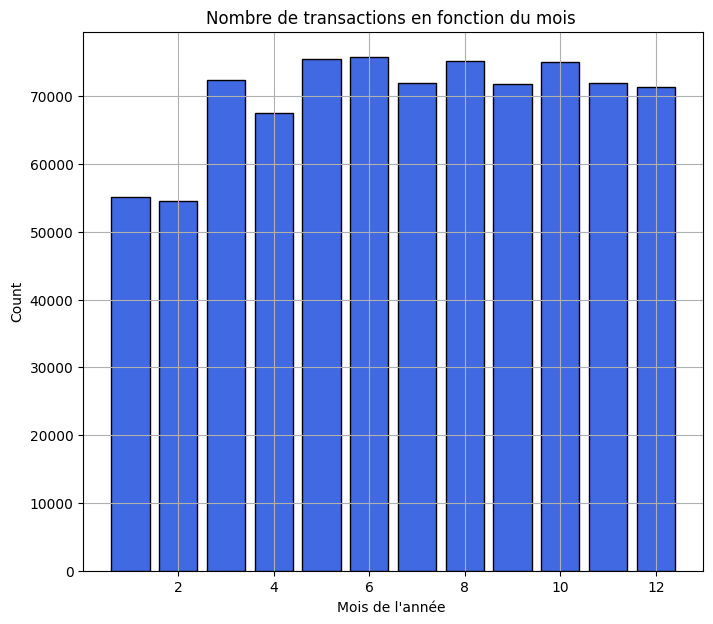

In [33]:
x = np.sort(df_A.month.unique())
#date
y = df_A.groupby('month')['month'].count()
#count 




fig, ax = plt.subplots(figsize=(8,7))
rects2= ax.bar(x,y,
                color='royalblue', edgecolor = "black")
plt.grid
plt.title('Nombre de transactions en fonction du mois ')
plt.xlabel("Mois de l'année ") 
plt.ylabel("Count")
plt.grid()
plt.show()

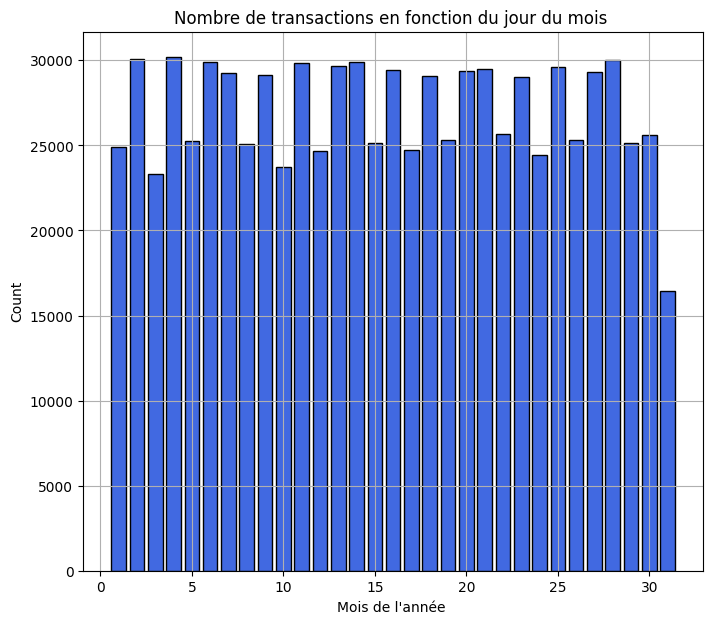

In [34]:
x = np.sort(df_A.day.unique())
#date
y = df_A.groupby('day')['day'].count()
#count 




fig, ax = plt.subplots(figsize=(8,7))
rects2= ax.bar(x,y,
                color='royalblue', edgecolor = "black")
#plt.legend('Revenue', 'Budget')
plt.title('Nombre de transactions en fonction du jour du mois ')
plt.xlabel("Mois de l'année ") 
plt.ylabel("Count")
plt.grid()
plt.show()

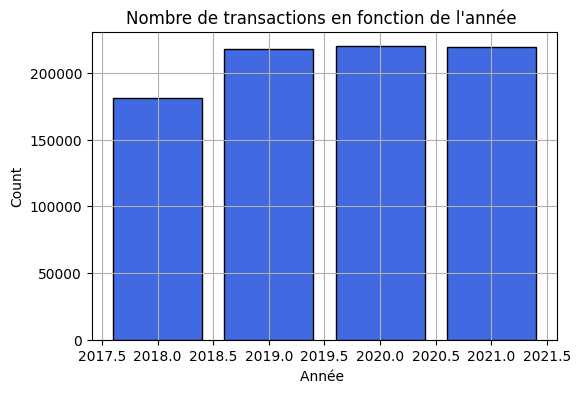

In [35]:
x = np.sort(df_A.year.unique())
#date
y = df_A.groupby('year')['year'].count()
#count 




fig, ax = plt.subplots(figsize=(6,4))
rects2= ax.bar(x,y, color='royalblue', edgecolor = "black")

plt.title("Nombre de transactions en fonction de l'année ")
plt.xlabel("Année ") 
plt.ylabel("Count")
plt.grid()
plt.show()

## On va faire des stats descriptives sur le data frame enrichi à l'aide de la base clients

#### On reprend le code de la partie modé pour la gestion des valeurs manquantes et la création de nouvelles variables 

In [36]:
df=pd.read_csv('df_merge.csv', low_memory=False, index_col='Unnamed: 0')
df.drop(df.index[1083398], inplace=True)
df

,tx_id,sender_account_id,receiver_account_id,tx_amount,timestamp,tx_type,sender_bank_id,sender_first_name,sender_last_name,sender_country_code,...,reliability_sender_A,reliability_sender_B,ecarts_tx_received_A,ecarts_tx_received_B,ecarts_tx_sent_A,ecarts_tx_sent_B,jour_année_tx,jour_mois_tx,année_tx,mois_tx
0,33859.0,6540.0,9883.0,586.61,2018-04-07,WIRE,A,Aaron,Behrmann,FR,...,1.000000,1.000000,40.656996,-71.348819,0.000000,219.870222,97.0,7.0,2018.0,4.0
1,40948.0,6540.0,9883.0,586.61,2018-04-14,WIRE,A,Aaron,Behrmann,FR,...,1.000000,1.000000,119.650647,-92.223342,0.000000,219.870222,104.0,14.0,2018.0,4.0
2,42015.0,6540.0,9883.0,586.61,2018-04-21,CHECK,A,Aaron,Behrmann,FR,...,1.000000,1.000000,40.656996,-95.501115,0.000000,219.870222,111.0,21.0,2018.0,4.0
3,50884.0,6540.0,9883.0,586.61,2018-04-28,WIRE,A,Aaron,Behrmann,FR,...,1.000000,1.000000,40.656996,-99.820685,0.000000,219.870222,118.0,28.0,2018.0,4.0
4,60406.0,6540.0,9883.0,586.61,2018-05-05,WIRE,A,Aaron,Behrmann,FR,...,1.000000,1.000000,40.656996,-99.908519,0.000000,219.870222,125.0,5.0,2018.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1083393,1111899.0,NaN,3394.0,129.24,2021-05-22,CHECK,C,Zenobia,Janak,FR,...,1.000000,1.000000,-76.651672,-73.518564,-28.671560,0.000000,142.0,22.0,2021.0,5.0
1083394,1182395.0,NaN,3394.0,129.24,2021-07-31,WIRE,C,Zenobia,Janak,FR,...,1.000000,1.000000,-76.651672,-73.518564,-28.671560,0.000000,212.0,31.0,2021.0,7.0
1083395,1248997.0,NaN,3394.0,129.24,2021-10-09,WIRE,C,Zenobia,Janak,FR,...,1.000000,1.000000,-76.651672,-73.518564,-28.671560,0.000000,282.0,9.0,2021.0,10.0
1083396,1313587.0,NaN,3394.0,129.24,2021-12-18,CHECK,C,Zenobia,Janak,FR,...,1.000000,1.000000,-76.651672,-73.518564,-28.671560,0.000000,352.0,18.0,2021.0,12.0


In [37]:
df['timestamp'] = pd.to_datetime(df.timestamp, format='%Y-%m-%d', errors = 'ignore')
df['sender_birth_date'] = pd.to_datetime(df.sender_birth_date, format='%Y-%m-%d', errors = 'ignore')
df['receiver_birth_date'] = pd.to_datetime(df.receiver_birth_date, format='%Y-%m-%d', errors = 'ignore')

df.sort_values(by='timestamp', ascending=True, inplace=True)

In [38]:
df['is_alert_pooled'].value_counts()

False    1082018
True        1380
Name: is_alert_pooled, dtype: int64

In [39]:
def filter_df(time, df_to_filter):
    " Fonction qui renvoie un df trié en ne prenant que les dates du passé "
    " mettre le time sous forme 'yyyy-mm-dd' "
    df_1 = df_to_filter[df_to_filter['timestamp']<time].copy()
    return df_1



variables_to_keep = ['tx_amount','timestamp', 'tx_type',
       
       'sender_country_code', 'sender_birth_date',
       'receiver_country_code', 'receiver_birth_date',

       'jour_année_tx', 'jour_mois_tx', 'année_tx', 'mois_tx',

       'count_cum_sender_A', 'median_cum_sender_A', 'mean_cum_sender_A',
       'variance_cum_sender_A', 'nb_is_alert_solo_sender_A',

       'count_cum_sender_B', 'median_cum_sender_B', 'mean_cum_sender_B',
       'variance_cum_sender_B', 'nb_is_alert_solo_sender_B',

       'count_cum_receiver_A', 'median_cum_receiver_A', 'mean_cum_receiver_A',
       'variance_cum_receiver_A', 'nb_is_alert_solo_receiver_A',

       'count_cum_receiver_B', 'median_cum_receiver_B', 'mean_cum_receiver_B',
       'variance_cum_receiver_B', 'nb_is_alert_solo_receiver_B',

       'reliability_receiver_A', 'reliability_receiver_B',
       'reliability_sender_A', 'reliability_sender_B', 

       'ecarts_tx_received_A','ecarts_tx_received_B', 
       'ecarts_tx_sent_A', 'ecarts_tx_sent_B',

       'sender_bank_id','receiver_bank_id',

       'is_alert_solo', 'is_alert_pooled']

variables_to_drop = ['tx_id', 'sender_account_id', 'receiver_account_id', 'sender_first_name',
       'sender_last_name', 'sender_zip_code', 'receiver_first_name',
       'receiver_last_name', 'receiver_zip_code']

df_bis=df[variables_to_keep].copy()

In [40]:
df_bis['is_alert_pooled']= df_bis['is_alert_pooled'].apply( lambda x : int(x))
df_bis['is_alert_solo']= df_bis['is_alert_solo'].apply( lambda x : int(x))

In [41]:
#Variable catégorielle tx_type

tx_type_ = pd.get_dummies(df_bis['tx_type'],drop_first=True)
df_bis= pd.concat([df_bis, tx_type_], axis=1)
df_bis.drop(['tx_type'],axis=1,inplace=True)
df_bis.rename(columns={'WIRE': 'tx_type', 
                           }, inplace=True)
df_bis.head(3)


# Gestion des variables catégorielles 
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
L=['sender_country_code','receiver_country_code', 'sender_bank_id','receiver_bank_id']
for i in L: 
    le.fit(df_bis[i])
    le.classes_
    df_bis[i]= le.transform(df_bis[i])
    display(pd.DataFrame(index= [j for j in range(len(df_bis[i].unique()))],
                         data=le.inverse_transform([j for j in range(len(df_bis[i].unique()))]), columns= [i]))

,sender_country_code
0,AE
1,AF
2,AR
3,AT
4,AU
...,...
75,YE
76,ZA
77,ZM
78,ZW


,receiver_country_code
0,AE
1,AF
2,AR
3,AT
4,AU
...,...
78,YE
79,ZA
80,ZM
81,ZW


,sender_bank_id
0,A
1,B
2,C


,receiver_bank_id
0,A
1,B
2,C


In [42]:
# On enlève les transactions avec un montant nul 
df_bis = df_bis.drop(df_bis[df_bis.tx_amount==0].index)

In [43]:
for i in ['count_cum_receiver_A','count_cum_receiver_B','count_cum_sender_A','count_cum_sender_B']: 
    df_bis[i]=df_bis[i].fillna(0)

for i in ['reliability_receiver_A','reliability_receiver_B','reliability_sender_A', 'reliability_sender_B']:
    df_bis[i]=df_bis[i].fillna(1)
    
for i in ['ecarts_tx_received_A','ecarts_tx_received_B','ecarts_tx_sent_A', 'ecarts_tx_sent_B']:
    df_bis[i]=df_bis[i].fillna(0)


for i in ['median_cum_sender_B','mean_cum_sender_B','median_cum_receiver_B','mean_cum_receiver_B', 'median_cum_sender_A','mean_cum_sender_A','median_cum_receiver_A','mean_cum_receiver_A']:
    df_bis[i]=df_bis[i].fillna(df_bis['tx_amount'])


df_bis[['variance_cum_sender_B', 'variance_cum_receiver_B']]= df_bis[['variance_cum_sender_B', 'variance_cum_receiver_B']].fillna(0)
df_bis[['variance_cum_sender_A', 'variance_cum_receiver_A']]= df_bis[['variance_cum_sender_A', 'variance_cum_receiver_A']].fillna(0)

df_bis[['nb_is_alert_solo_receiver_A','nb_is_alert_solo_sender_A']]= df_bis[['nb_is_alert_solo_receiver_A','nb_is_alert_solo_sender_A']].fillna(0)
df_bis[['nb_is_alert_solo_receiver_B','nb_is_alert_solo_sender_B']]= df_bis[['nb_is_alert_solo_receiver_B','nb_is_alert_solo_sender_B']].fillna(0)

In [44]:
#Écart
df_bis['ecarts_tx_received_A']= (df_bis.tx_amount - df_bis.median_cum_receiver_A)/df_bis.median_cum_receiver_A*100
df_bis['ecarts_tx_received_B']= (df_bis.tx_amount - df_bis.median_cum_receiver_B)/df_bis.median_cum_receiver_B*100
df_bis['ecarts_tx_sent_A']= (df_bis.tx_amount - df_bis.median_cum_sender_A)/df_bis.median_cum_sender_A*100
df_bis['ecarts_tx_sent_B']= (df_bis.tx_amount - df_bis.median_cum_sender_B)/df_bis.median_cum_sender_B*100

df_bis = df_bis.replace([np.inf, -np.inf], np.nan)

# supprimer les lignes avec des valeurs manquantes (NaN)
df_bis.dropna(inplace=True)

In [45]:
df_bis[df_bis.isnull().any(axis=1)]

,tx_amount,timestamp,sender_country_code,sender_birth_date,receiver_country_code,receiver_birth_date,jour_année_tx,jour_mois_tx,année_tx,mois_tx,...,reliability_sender_B,ecarts_tx_received_A,ecarts_tx_received_B,ecarts_tx_sent_A,ecarts_tx_sent_B,sender_bank_id,receiver_bank_id,is_alert_solo,is_alert_pooled,tx_type


In [46]:
df_bis.columns

Index(['tx_amount', 'timestamp', 'sender_country_code', 'sender_birth_date',
       'receiver_country_code', 'receiver_birth_date', 'jour_année_tx',
       'jour_mois_tx', 'année_tx', 'mois_tx', 'count_cum_sender_A',
       'median_cum_sender_A', 'mean_cum_sender_A', 'variance_cum_sender_A',
       'nb_is_alert_solo_sender_A', 'count_cum_sender_B',
       'median_cum_sender_B', 'mean_cum_sender_B', 'variance_cum_sender_B',
       'nb_is_alert_solo_sender_B', 'count_cum_receiver_A',
       'median_cum_receiver_A', 'mean_cum_receiver_A',
       'variance_cum_receiver_A', 'nb_is_alert_solo_receiver_A',
       'count_cum_receiver_B', 'median_cum_receiver_B', 'mean_cum_receiver_B',
       'variance_cum_receiver_B', 'nb_is_alert_solo_receiver_B',
       'reliability_receiver_A', 'reliability_receiver_B',
       'reliability_sender_A', 'reliability_sender_B', 'ecarts_tx_received_A',
       'ecarts_tx_received_B', 'ecarts_tx_sent_A', 'ecarts_tx_sent_B',
       'sender_bank_id', 'receiver_bank_

In [47]:
num_cols= ['tx_amount',
       'count_cum_sender_A', 'median_cum_sender_A', 'mean_cum_sender_A',
       'variance_cum_sender_A', 'nb_is_alert_solo_sender_A',
       'count_cum_sender_B', 'median_cum_sender_B', 'mean_cum_sender_B',
       'variance_cum_sender_B', 'nb_is_alert_solo_sender_B',
       'count_cum_receiver_A', 'median_cum_receiver_A', 'mean_cum_receiver_A',
       'variance_cum_receiver_A', 'nb_is_alert_solo_receiver_A',
       'count_cum_receiver_B', 'median_cum_receiver_B', 'mean_cum_receiver_B',
       'variance_cum_receiver_B', 'nb_is_alert_solo_receiver_B',
       'reliability_receiver_A', 'reliability_receiver_B',
       'reliability_sender_A', 'reliability_sender_B', 'ecarts_tx_received_A',
       'ecarts_tx_received_B', 'ecarts_tx_sent_A', 'ecarts_tx_sent_B']

cat_cols= ['sender_country_code', 'receiver_country_code',
       'jour_année_tx', 'jour_mois_tx', 'année_tx', 'mois_tx',
       'sender_bank_id', 'receiver_bank_id', 'is_alert_solo', 'tx_type']

array([[<AxesSubplot:title={'center':'tx_amount'}>,
        <AxesSubplot:title={'center':'count_cum_sender_A'}>,
        <AxesSubplot:title={'center':'median_cum_sender_A'}>,
        <AxesSubplot:title={'center':'mean_cum_sender_A'}>,
        <AxesSubplot:title={'center':'variance_cum_sender_A'}>],
       [<AxesSubplot:title={'center':'nb_is_alert_solo_sender_A'}>,
        <AxesSubplot:title={'center':'count_cum_sender_B'}>,
        <AxesSubplot:title={'center':'median_cum_sender_B'}>,
        <AxesSubplot:title={'center':'mean_cum_sender_B'}>,
        <AxesSubplot:title={'center':'variance_cum_sender_B'}>],
       [<AxesSubplot:title={'center':'nb_is_alert_solo_sender_B'}>,
        <AxesSubplot:title={'center':'count_cum_receiver_A'}>,
        <AxesSubplot:title={'center':'median_cum_receiver_A'}>,
        <AxesSubplot:title={'center':'mean_cum_receiver_A'}>,
        <AxesSubplot:title={'center':'variance_cum_receiver_A'}>],
       [<AxesSubplot:title={'center':'nb_is_alert_solo_recei

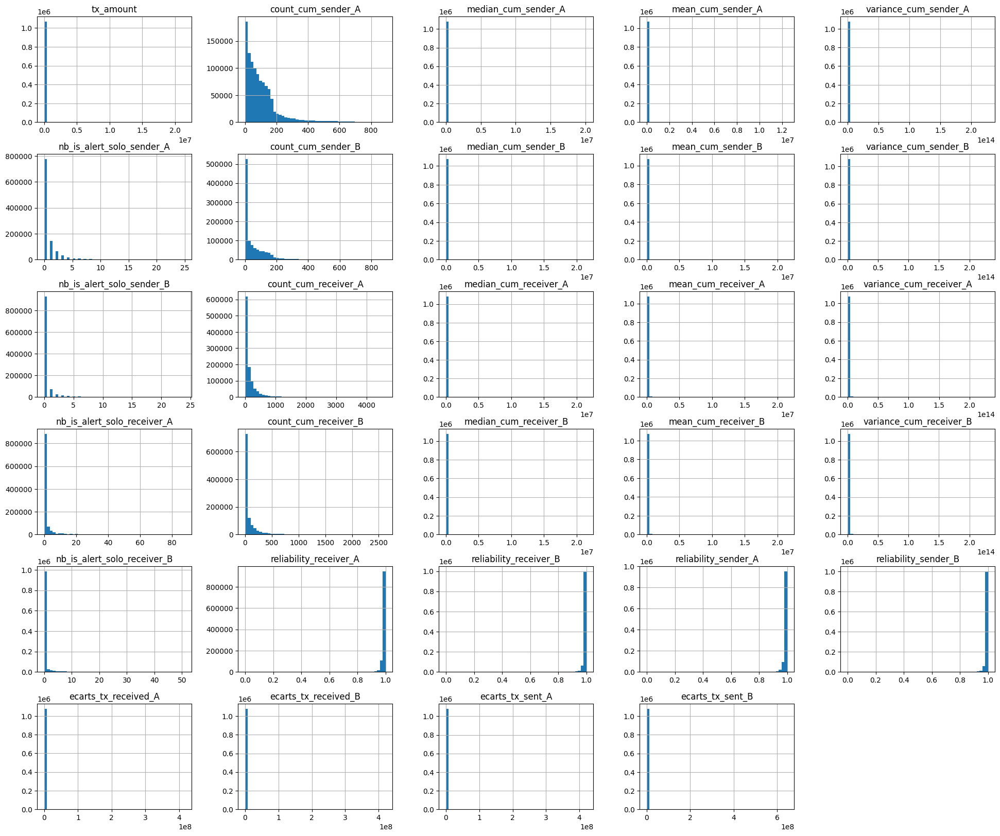

In [48]:
df_bis[num_cols].hist(bins= 50, figsize=(24,20))

In [56]:
import scipy
from scipy import stats

/opt/anaconda3/envs/jupyterlab-3.3.2/lib/python3.10/site-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/opt/anaconda3/envs/jupyterlab-3.3.2/lib/python3.10/site-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


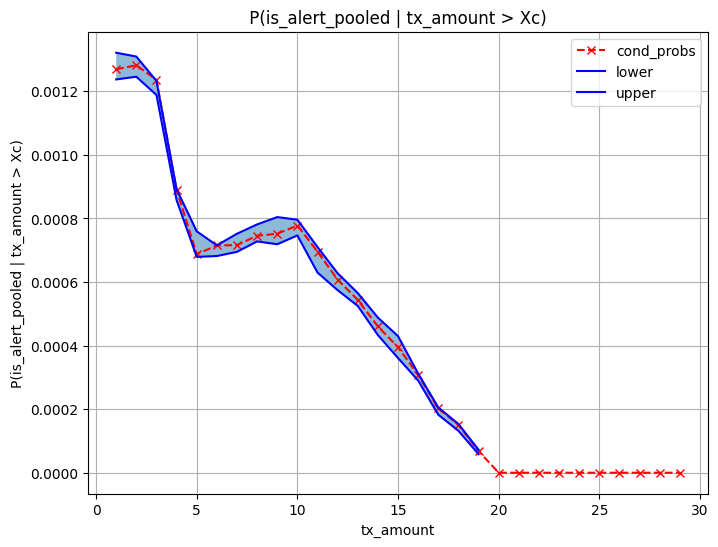

In [102]:
# Define the function to calculate conditional probabilities
def calc_cond_prob(df, Xc):
    data_subset = df[df["tx_amount"] > Xc]
    probs = []
    for i in range(10): # Bootstrap 10 samples
        sample = data_subset.sample(frac=0.5, replace=True) #tirage avec remplacement de la moitié du dataset
        #display(sample)
        p = sample["is_alert_pooled"].sum()/sample["is_alert_pooled"].count()
        probs.append(p)
    probs = np.array(probs)
    lower_ci, upper_ci = stats.t.interval(0.95, len(probs)-1, loc=probs.mean(), scale=stats.sem(probs))
    return probs.mean(), lower_ci, upper_ci

# Calculate conditional probabilities for each Xc value
Xc_values=[]
cond_probs=[]
lower=[]
upper=[]
for i in range(1,30): 
    Xc_values.append(i)
    cond_probs.append(calc_cond_prob(df_bis, i)[0])
    lower.append(calc_cond_prob(df_bis, i)[1])
    upper.append(calc_cond_prob(df_bis, i)[2])

# Create the plot
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(Xc_values, cond_probs, 'rx--', label='cond_probs')
ax.plot(Xc_values, lower, 'b', label='lower')
ax.plot(Xc_values, upper, 'b', label='upper')
ax.legend(loc='best')
ax.grid()
ax.set_xlabel("tx_amount")
ax.set_ylabel("P(is_alert_pooled | tx_amount > Xc)")
ax.set_title(" P(is_alert_pooled | tx_amount > Xc) ")
ax.fill_between(Xc_values, lower, upper, alpha=0.5, linewidth=0.2) # shade the 95% CI

In [74]:
df.describe()

,tx_id,sender_account_id,receiver_account_id,tx_amount,sender_zip_code,receiver_zip_code,count_cum_sender_A,median_cum_sender_A,mean_cum_sender_A,variance_cum_sender_A,...,reliability_sender_A,reliability_sender_B,ecarts_tx_received_A,ecarts_tx_received_B,ecarts_tx_sent_A,ecarts_tx_sent_B,jour_année_tx,jour_mois_tx,année_tx,mois_tx
count,1.083398e+06,652710.000000,699169.000000,1.083398e+06,1.083398e+06,1.083398e+06,1.083398e+06,1.083398e+06,1.083398e+06,1.072022e+06,...,1.083398e+06,703483.000000,1.083398e+06,7.034830e+05,1083384.0,7.034830e+05,1.083398e+06,1.083398e+06,1.083398e+06,1.083398e+06
mean,6.616909e+05,6015.143629,6877.343596,1.140980e+05,4.662830e+04,4.643772e+04,1.061415e+02,6.157866e+03,2.478661e+04,2.173374e+11,...,9.934693e-01,0.993943,inf,inf,inf,inf,1.891308e+02,1.580501e+01,2.019569e+03,6.718876e+00
std,3.818531e+05,2913.610208,2804.633659,1.309250e+06,2.607726e+04,2.555236e+04,1.159604e+02,1.061969e+05,2.970636e+05,3.474724e+12,...,1.971983e-02,0.022090,NaN,NaN,NaN,NaN,1.024632e+02,8.794145e+00,1.096297e+00,3.348682e+00
min,2.000000e+00,1.000000,3.000000,0.000000e+00,1.000000e+03,1.000000e+03,1.000000e+00,0.000000e+00,0.000000e+00,-6.293212e-08,...,0.000000e+00,0.000000,-1.000000e+02,-1.000000e+02,-100.0,-1.000000e+02,2.000000e+00,1.000000e+00,2.018000e+03,1.000000e+00
25%,3.311122e+05,3612.000000,4840.000000,2.466000e+01,2.449000e+04,2.465000e+04,3.000000e+01,2.629000e+01,2.629000e+01,0.000000e+00,...,9.939394e-01,1.000000,-7.629572e+01,-7.570202e+01,0.0,-2.914730e+01,1.030000e+02,8.000000e+00,2.019000e+03,4.000000e+00
50%,6.618115e+05,6523.000000,7631.000000,1.587200e+02,4.932000e+04,4.816000e+04,7.600000e+01,1.600000e+02,1.597200e+02,0.000000e+00,...,1.000000e+00,1.000000,-6.162932e+00,-4.795699e+00,0.0,0.000000e+00,1.910000e+02,1.600000e+01,2.020000e+03,7.000000e+00
75%,9.923268e+05,8683.000000,9401.000000,4.459800e+02,6.729000e+04,6.550000e+04,1.390000e+02,4.486300e+02,4.480700e+02,0.000000e+00,...,1.000000e+00,1.000000,1.892975e+02,2.258860e+02,0.0,5.394737e+01,2.780000e+02,2.300000e+01,2.021000e+03,1.000000e+01
max,1.323234e+06,9995.000000,9995.000000,2.147484e+07,9.888100e+04,9.888100e+04,8.920000e+02,2.013677e+07,1.246496e+07,2.269883e+14,...,1.000000e+00,1.000000,inf,inf,inf,inf,3.630000e+02,3.100000e+01,2.021000e+03,1.200000e+01


In [75]:
df["is_alert_pooled"].sum()/df["is_alert_pooled"].count()

0.0012737701195682473

In [104]:
# Define the function to calculate conditional probabilities
def calc_cond_prob(df, Xc, variable):
    data_subset = df[df[variable] > Xc]
    probs = []
    for i in range(10): # Bootstrap 10 samples
        sample = data_subset.sample(frac=0.5, replace=True) #tirage avec remplacement de la moitié du dataset
        #display(sample)
        p = sample["is_alert_pooled"].sum()/sample["is_alert_pooled"].count()
        probs.append(p)
    probs = np.array(probs)
    lower_ci, upper_ci = stats.t.interval(0.95, len(probs)-1, loc=probs.mean(), scale=stats.sem(probs))
    return probs.mean(), lower_ci, upper_ci


def plot_proba_cond(df,variable):
    q_1 = int(df[variable].quantile(0.05))
    q_9 = int(df[variable].quantile(0.90))

    Xc_values = [i for i in range(q_1,q_9)] # Set the range of Xc values
    cond_probs = [calc_cond_prob(df_bis, Xc, variable) for Xc in Xc_values]

        # Calculate conditional probabilities for each Xc value
    Xc_values=[]
    cond_probs=[]
    lower=[]
    upper=[]
    for i in range(q_1,q_9): 
        Xc_values.append(i)
        cond_probs.append(calc_cond_prob(df_bis, i, variable)[0])
        lower.append(calc_cond_prob(df_bis, i, variable)[1])
        upper.append(calc_cond_prob(df_bis, i, variable)[2])

    # Create the plot
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(Xc_values, cond_probs, 'rx--', label='cond_probs')
    ax.plot(Xc_values, lower, 'b--', label='lower')
    ax.plot(Xc_values, upper, 'b--', label='upper')
    ax.legend(loc='best')
    ax.grid()
    ax.set_xlabel(f"{variable}")
    ax.set_ylabel(f"P(is_alert_pooled | {variable} > Xc)")
    ax.set_title(f" P(is_alert_pooled | {variable} > Xc) ")
    ax.fill_between(Xc_values, lower, upper, alpha=0.2, linewidth = 0.2) # shade the 95% CI


In [105]:
plot_proba_cond(df_bis, 'median_cum_sender_A')

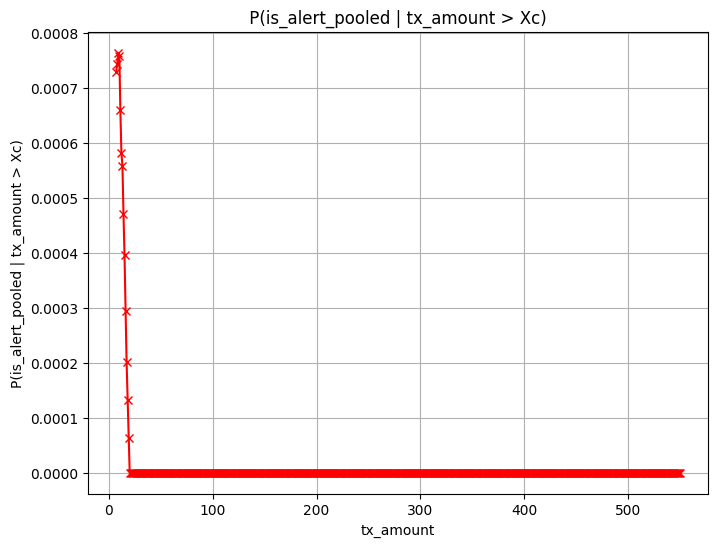

In [91]:
plot_proba_cond(df_bis, 'tx_amount')

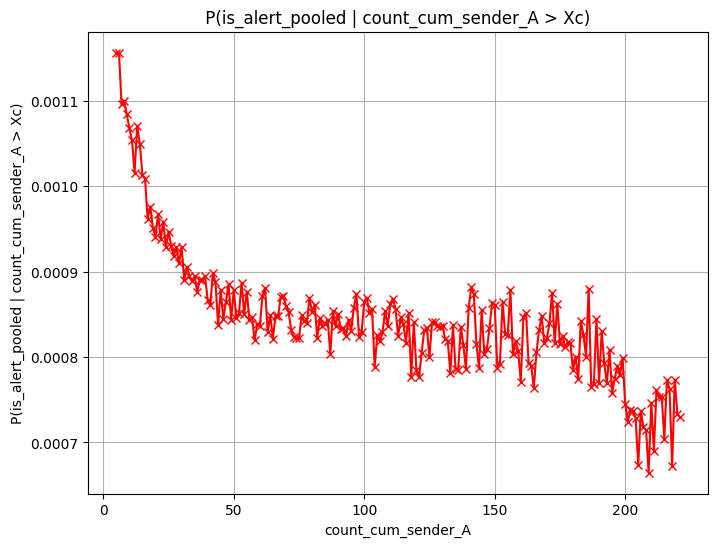

In [92]:
plot_proba_cond(df_bis, 'count_cum_sender_A')

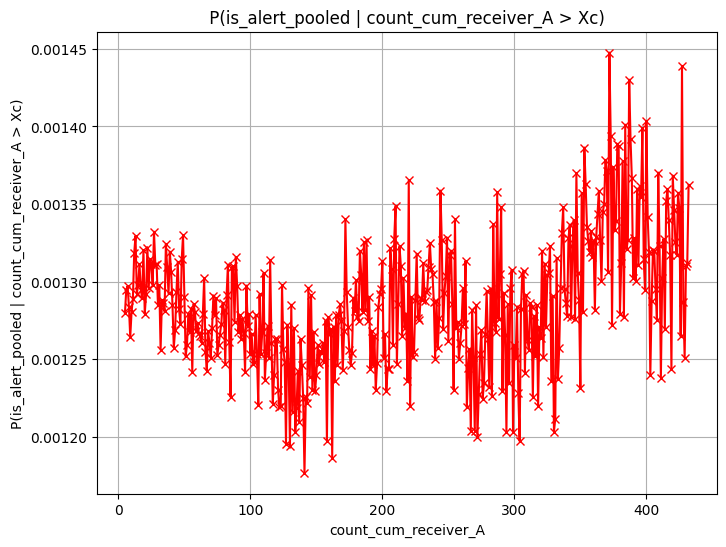

In [93]:
plot_proba_cond(df_bis, 'count_cum_receiver_A')

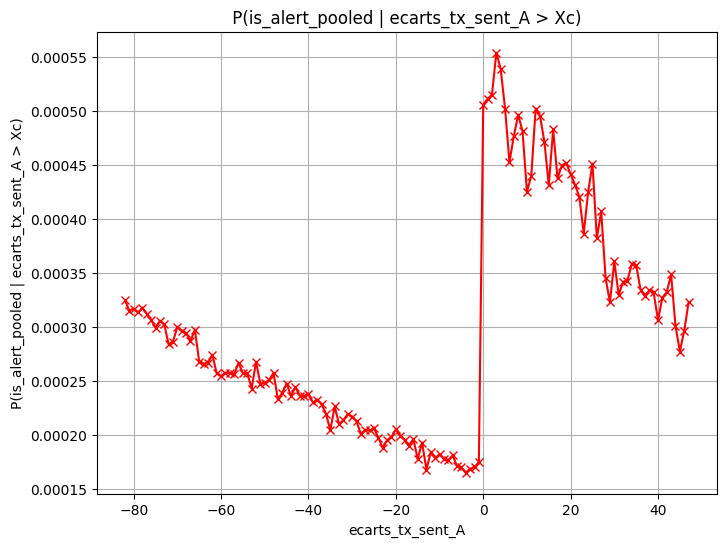

In [94]:
plot_proba_cond(df_bis, 'ecarts_tx_sent_A')

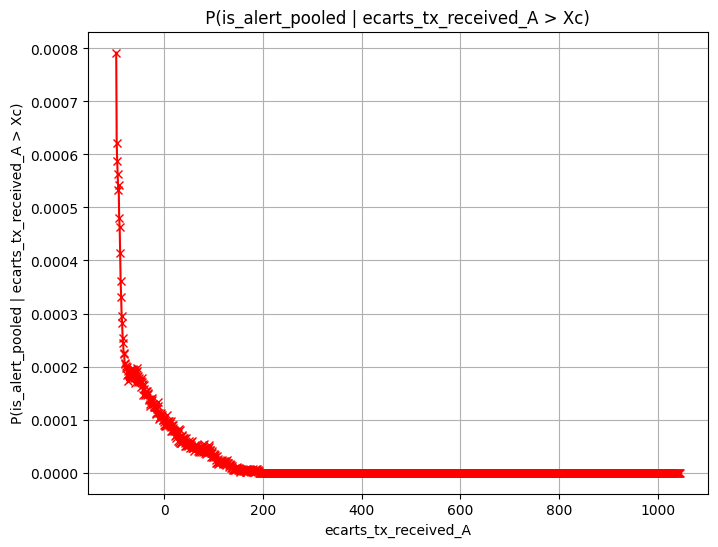

In [95]:
plot_proba_cond(df_bis, 'ecarts_tx_received_A')

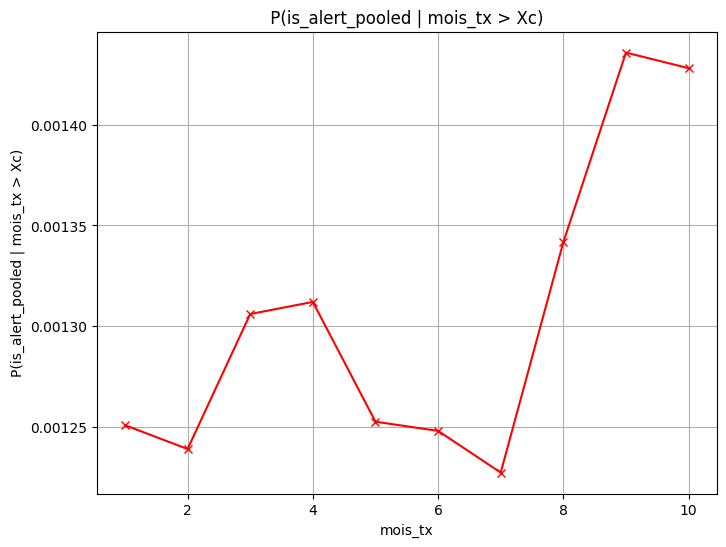

In [96]:
plot_proba_cond(df_bis, 'mois_tx')

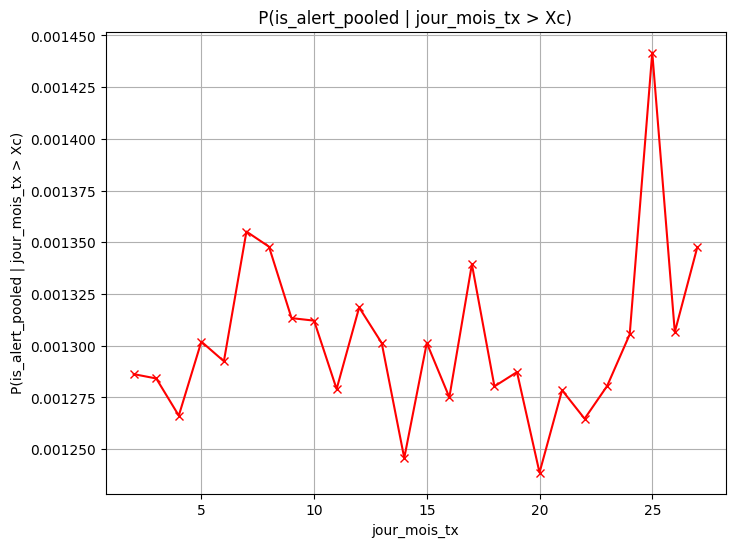

In [98]:
plot_proba_cond(df_bis, 'jour_mois_tx')